<a href="https://colab.research.google.com/github/KDT-GrabIT/Faster-R-CNN-Review/blob/main/Faster_R_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [47]:
import os
import shutil
import random
import time
import numpy as np
import xml.etree.ElementTree as ET
from tqdm import tqdm
from glob import glob
from sklearn.model_selection import train_test_split

In [2]:
zip_path = '/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/VOCdevkit.zip'
base_dir = '/content/experiment'
data_root = os.path.join(base_dir, 'VOC2007')

In [3]:
if not os.path.exists(data_root):
    print(f"📂 압축 해제 중... ({zip_path})")
    import zipfile
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(base_dir)
    print("✅ 압축 해제 완료!")

📂 압축 해제 중... (/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/VOCdevkit.zip)
✅ 압축 해제 완료!


In [21]:
image_files = glob(os.path.join(data_root, 'JPEGImages', '*.jpg'))
all_ids = [os.path.splitext(os.path.basename(f))[0] for f in image_files]

In [22]:
random.seed(2026)
random.shuffle(all_ids)

In [23]:
total_len = len(all_ids)
train_end = int(total_len * 0.8)
val_end = int(total_len * 0.9)

In [24]:
train_ids = all_ids[:train_end]
val_ids = all_ids[train_end:val_end]
test_ids = all_ids[val_end:]

In [25]:
print(f"📊 데이터 분할 완료")
print(f" - Train: {len(train_ids)}장")
print(f" - Val  : {len(val_ids)}장")
print(f" - Test : {len(test_ids)}장")

📊 데이터 분할 완료
 - Train: 7970장
 - Val  : 996장
 - Test : 997장


In [26]:
CLASSES = [
    "__background__",
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

In [27]:
!pip install -q torchmetrics

In [28]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import DataLoader, Dataset
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchmetrics.detection.mean_ap import MeanAveragePrecision

In [29]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [30]:
def get_train_transforms():
    return A.Compose([
        #YOLO의 Scale, Translate, Flip 효과
        A.HorizontalFlip(p=0.5),
        A.Affine(scale=(0.5, 1.5), translate_percent=(0.1, 0.1), rotate=(-10, 10), p=0.5, cval=0, mode=cv2.BORDER_CONSTANT),

        # YOLO의 hsv_h, hsv_s, hsv_v 효과
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.RandomBrightnessContrast(p=0.5),

        A.OneOf([
            A.GaussNoise(var_limit=(10.0, 50.0)),
            A.MotionBlur(blur_limit=3),
        ], p=0.2),

        # 텐서 변환 및 정규화
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels'], min_area=0.0, min_visibility=0.0))

def get_val_transforms():
    return A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

In [31]:
class VOCDataset(Dataset):
    def __init__(self, root, split_ids, transforms=None):
        self.root = root
        self.split_ids = split_ids
        self.transforms = transforms # 다시 추가됨

    def __getitem__(self, idx):
        file_id = self.split_ids[idx]
        img_path = os.path.join(self.root, "JPEGImages", f"{file_id}.jpg")
        xml_path = os.path.join(self.root, "Annotations", f"{file_id}.xml")

        # 이미지 로드 (RGB)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # XML 파싱
        tree = ET.parse(xml_path)
        root = tree.getroot()
        boxes = []
        labels = []

        for obj in root.iter("object"):
            if obj.find("difficult").text == '1': continue
            cls = obj.find("name").text
            if cls not in CLASSES: continue

            labels.append(CLASSES.index(cls))
            bnd = obj.find("bndbox")
            boxes.append([float(bnd.find("xmin").text), float(bnd.find("ymin").text),
                          float(bnd.find("xmax").text), float(bnd.find("ymax").text)])

        # Albumentations 적용
        if self.transforms:
            try:
                # 증강 적용
                transformed = self.transforms(image=img, bboxes=boxes, labels=labels)
                img = transformed['image']
                boxes = transformed['bboxes']
                labels = transformed['labels']
            except ValueError:
                # 증강 중 박스가 이미지 밖으로 나가서 에러나면 원본 사용 (안전장치)
                trans_val = get_val_transforms()
                transformed = trans_val(image=img, bboxes=boxes, labels=labels)
                img = transformed['image']
                boxes = transformed['bboxes']
                labels = transformed['labels']

        # 텐서 변환 (Faster R-CNN 포맷 맞춤)
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {"boxes": boxes, "labels": labels}
        return img, target

    def __len__(self):
        return len(self.split_ids)

In [32]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [33]:
train_ds = VOCDataset(data_root, train_ids, transforms=get_train_transforms())
val_ds = VOCDataset(data_root, val_ids, transforms=get_val_transforms())

/tmp/ipython-input-2922589892.py:5: UserWarning: Argument(s) 'cval, mode' are not valid for transform Affine
  A.Affine(scale=(0.5, 1.5), translate_percent=(0.1, 0.1), rotate=(-10, 10), p=0.5, cval=0, mode=cv2.BORDER_CONSTANT),
/tmp/ipython-input-2922589892.py:12: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0)),
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


In [34]:
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, collate_fn=collate_fn, num_workers=4)
val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=4)

In [35]:
model_frcnn = fasterrcnn_resnet50_fpn(weights="DEFAULT", min_size=640, max_size=640)
in_features = model_frcnn.roi_heads.box_predictor.cls_score.in_features
model_frcnn.roi_heads.box_predictor = FastRCNNPredictor(in_features, len(CLASSES))
model_frcnn.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 236MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640,), max_size=640, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(i

In [36]:
params = [p for p in model_frcnn.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
metric = MeanAveragePrecision(class_metrics=False).to(device)
num_epochs = 10
best_map = 0.0

In [37]:
SAVE_DIR = '/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN'
os.makedirs(SAVE_DIR, exist_ok=True) # 폴더 없으면 생성
print(f"📂 가중치 저장 경로 설정 완료: {SAVE_DIR}")

📂 가중치 저장 경로 설정 완료: /content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN


In [39]:
for epoch in range(num_epochs):
    # Train
    model_frcnn.train()
    train_loss = 0
    for imgs, targets in train_loader:
        imgs = list(img.to(device) for img in imgs)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model_frcnn(imgs, targets)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        train_loss += losses.item()

    # Validation
    model_frcnn.eval()
    metric.reset()

    val_timer = 0.0
    total_val_imgs = 0

    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs = list(img.to(device) for img in imgs)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            # [속도 측정 시작]
            if torch.cuda.is_available(): torch.cuda.synchronize() # GPU 대기
            start_time = time.time()

            outputs = model_frcnn(imgs) # 추론

            if torch.cuda.is_available(): torch.cuda.synchronize() # GPU 완료 대기
            end_time = time.time()
            # [속도 측정 끝]

            val_timer += (end_time - start_time)
            total_val_imgs += len(imgs)

            metric.update(outputs, targets)

    result = metric.compute()
    map_50 = result['map_50'].item()
    map_coco = result['map'].item()
    avg_latency = (val_timer / total_val_imgs) * 1000 # ms 단위 변환
    fps = total_val_imgs / val_timer

    print(f"Epoch {epoch+1} | Loss: {train_loss/len(train_loader):.4f}")
    print(f"   ⏱️  Speed: {avg_latency:.2f} ms/img (FPS: {fps:.2f})") # <--- 여기 확인!
    print(f"   🎯 mAP@0.5: {map_50:.4f} | mAP 50-95: {map_coco:.4f}")

    # [핵심] Best Model 저장 로직
    if map_50 > best_map:
        best_map = map_50
        save_path = os.path.join(SAVE_DIR, 'faster_rcnn_best.pth')
        torch.save(model_frcnn.state_dict(), save_path)
        print(f"   🏆 New Best Model Saved! ({save_path})")

print(f"✅ Faster R-CNN 학습 완료! (최고 mAP: {best_map:.4f})")

Epoch 1 | Loss: 0.3262
   ⏱️  Speed: 10.21 ms/img (FPS: 97.97)
   🎯 mAP@0.5: 0.7896 | mAP 50-95: 0.4679
   🏆 New Best Model Saved! (/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/faster_rcnn_best.pth)
Epoch 2 | Loss: 0.3050
   ⏱️  Speed: 10.09 ms/img (FPS: 99.08)
   🎯 mAP@0.5: 0.8090 | mAP 50-95: 0.4949
   🏆 New Best Model Saved! (/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/faster_rcnn_best.pth)
Epoch 3 | Loss: 0.2952
   ⏱️  Speed: 10.11 ms/img (FPS: 98.90)
   🎯 mAP@0.5: 0.8091 | mAP 50-95: 0.5031
   🏆 New Best Model Saved! (/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/faster_rcnn_best.pth)
Epoch 4 | Loss: 0.2881
   ⏱️  Speed: 10.10 ms/img (FPS: 98.97)
   🎯 mAP@0.5: 0.8136 | mAP 50-95: 0.5123
   🏆 New Best Model Saved! (/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/faster_rcnn_best.pth)
Epoch 5 | Loss: 0.2832
   ⏱️  Speed: 10.18 ms/img (FPS: 98.22)
   🎯 mAP@0.5: 0.8051 | mAP 50-95: 0.5

In [40]:
BASE_DIR = '/content/experiment'
DATA_ROOT = os.path.join(BASE_DIR, 'VOC2007') # 원본(XML)
YOLO_ROOT = os.path.join(BASE_DIR, 'yolo_data')             # 타겟(TXT)
SAVE_DIR = '/content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN'

In [41]:
CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

In [42]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5
    !pip install -qr yolov5/requirements.txt

In [43]:
def convert_bbox_to_yolo(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

In [44]:
image_files = glob(os.path.join(DATA_ROOT, 'JPEGImages', '*.jpg'))
all_ids = [os.path.splitext(os.path.basename(f))[0] for f in image_files]

In [45]:
train_end = int(len(all_ids) * 0.8)
val_end = int(len(all_ids) * 0.9)
splits = {
    'train': all_ids[:train_end],
    'val': all_ids[train_end:val_end],
    'test': all_ids[val_end:]
}

In [48]:
for split, ids in splits.items():
    # 폴더 생성
    img_dir = os.path.join(YOLO_ROOT, 'images', split)
    lbl_dir = os.path.join(YOLO_ROOT, 'labels', split)
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)

    # 이미 파일이 있으면 건너뛰기 (시간 절약)
    if len(os.listdir(img_dir)) == len(ids):
        print(f"   - {split} 데이터셋 준비 완료 (Skip)")
        continue

    print(f"   - {split} 변환 중 ({len(ids)}장)...")
    for file_id in tqdm(ids):
        # 1. 이미지 복사
        src_img = os.path.join(DATA_ROOT, 'JPEGImages', f"{file_id}.jpg")
        dst_img = os.path.join(img_dir, f"{file_id}.jpg")
        if not os.path.exists(dst_img):
            shutil.copy(src_img, dst_img)

        # 2. 라벨 변환
        xml_path = os.path.join(DATA_ROOT, 'Annotations', f"{file_id}.xml")
        txt_path = os.path.join(lbl_dir, f"{file_id}.txt")

        if os.path.exists(xml_path):
            tree = ET.parse(xml_path)
            root = tree.getroot()
            size = root.find('size')
            w, h = int(size.find('width').text), int(size.find('height').text)

            with open(txt_path, 'w') as f:
                for obj in root.iter('object'):
                    if obj.find('difficult').text == '1': continue
                    cls_name = obj.find('name').text
                    if cls_name not in CLASSES: continue

                    cls_id = CLASSES.index(cls_name)
                    bndbox = obj.find('bndbox')
                    b = (float(bndbox.find('xmin').text), float(bndbox.find('xmax').text),
                         float(bndbox.find('ymin').text), float(bndbox.find('ymax').text))
                    bb = convert_bbox_to_yolo((w, h), b)
                    f.write(f"{cls_id} {bb[0]:.6f} {bb[1]:.6f} {bb[2]:.6f} {bb[3]:.6f}\n")

   - train 변환 중 (7970장)...


100%|██████████| 7970/7970 [00:02<00:00, 2945.54it/s]


   - val 변환 중 (996장)...


100%|██████████| 996/996 [00:00<00:00, 2792.96it/s]


   - test 변환 중 (997장)...


100%|██████████| 997/997 [00:00<00:00, 3007.96it/s]


In [49]:
yaml_content = f"""
train: {os.path.join(YOLO_ROOT, 'images', 'train')}
val: {os.path.join(YOLO_ROOT, 'images', 'val')}
test: {os.path.join(YOLO_ROOT, 'images', 'test')}
nc: {len(CLASSES)}
names: {CLASSES}
"""
with open(os.path.join(YOLO_ROOT, 'voc.yaml'), 'w') as f:
    f.write(yaml_content)

In [51]:
os.environ['WANDB_MODE'] = 'disabled'

In [52]:
!python yolov5/train.py \
    --img 640 \
    --batch 16 \
    --epochs 10 \
    --data {YOLO_ROOT}/voc.yaml \
    --weights yolov5s.pt \
    --name voc_yolo_batch16 \
    2>&1 | grep -v "it/s" | grep -v "autocast" | grep -v "FutureWarning"

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2026-02-01 03:22:08.023341: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1769916128.045787   16910 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1769916128.052565   16910 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1769916128.070800   16910 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1769916128.070826   16910 computation_placer.cc:177] computation placer already registere

In [55]:
src_weight = 'yolov5/runs/train/voc_yolo_batch162/weights/best.pt'
dst_weight = os.path.join(SAVE_DIR, 'yolov5_best.pt')

if os.path.exists(src_weight):
    shutil.copy(src_weight, dst_weight)
    print(f"\n🏆 [완료] YOLOv5 Best 모델 저장됨: {dst_weight}")
else:
    print(f"\n❌ [오류] 학습 결과 파일을 찾을 수 없습니다.")


🏆 [완료] YOLOv5 Best 모델 저장됨: /content/drive/MyDrive/랭체인 AI 영상객체탐지분석 플랫폼 구축/그래빗(GrabIT)/Faster R-CNN/yolov5_best.pt


In [56]:
!python yolov5/val.py \
    --weights {src_weight} \
    --data {YOLO_ROOT}/voc.yaml \
    --img 640 \
    --batch 16 \
    --task val \
    --name final_benchmark \
    --verbose \
    2>&1 | grep -v "it/s" | grep -v "FutureWarning" | grep -v "autocast"

val: data=/content/experiment/yolo_data/voc.yaml, weights=['yolov5/runs/train/voc_yolo_batch162/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=final_benchmark, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-457-g84ef1e59 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
                   all        996       2559       0.75      0.742      0.793      0.522
             aeroplane        996         71      0.897      0.845      0.932      0.552
               bicycle        996         81      0.749      0.802      0.843      0.605
                  bird        996        105      0.823      0.798      0.854      0.476
                  boat        996

In [57]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [58]:
test_images_all = glob(os.path.join(YOLO_ROOT, 'images', 'test', '*.jpg'))

In [59]:
selected_imgs = random.sample(test_images_all, 10)
CLASSES = [
    "__background__", "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]
COLORS = [[random.randint(0, 255) for _ in range(3)] for _ in range(len(CLASSES))]


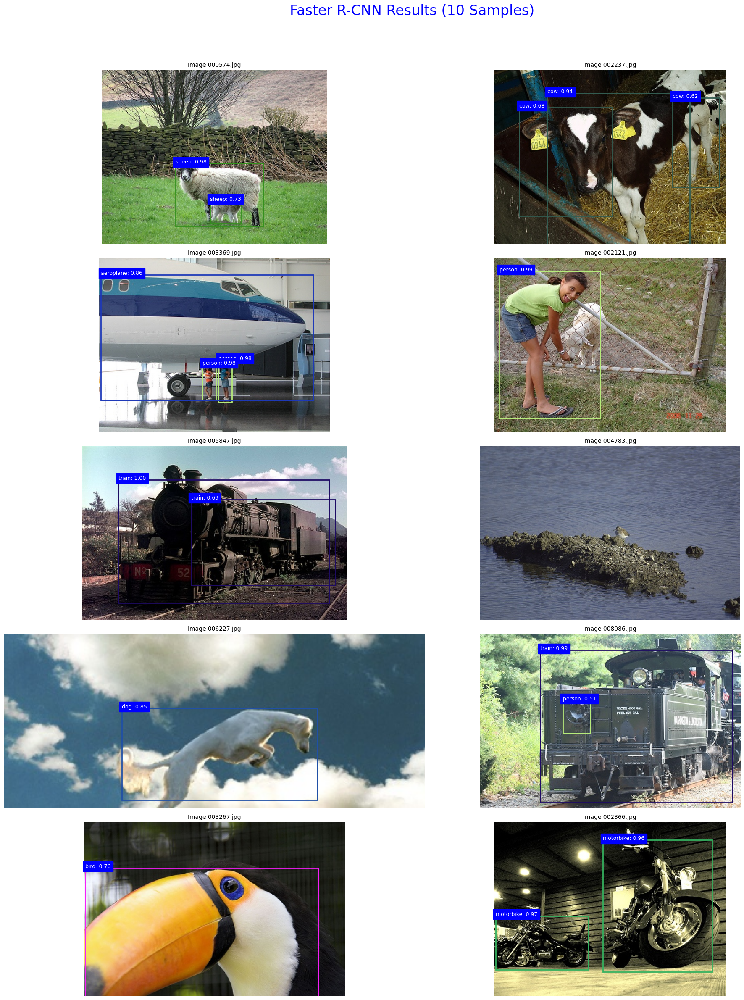

In [60]:
# Faster R-CNN 결과 시각화 (10장)
fig, axes = plt.subplots(5, 2, figsize=(20, 25))
fig.suptitle('Faster R-CNN Results (10 Samples)', fontsize=24, color='blue')
axes = axes.flatten()

# 모델이 메모리에 있는지 확인
if 'model_frcnn' not in locals():
    print("⚠️ Faster R-CNN 모델이 메모리에 없습니다. 학습 코드를 먼저 실행해주세요.")
else:
    model_frcnn.eval()
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    for i, img_path in enumerate(selected_imgs):
        # 이미지 로드 및 전처리
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_tensor = torch.from_numpy(img_rgb/255.0).permute(2,0,1).float().to(device).unsqueeze(0)

        # 추론
        with torch.no_grad():
            output = model_frcnn(img_tensor)[0]

        # 그리기
        ax = axes[i]
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(f"Image {os.path.basename(img_path)}", fontsize=10)

        # 바운딩 박스 그리기 (Threshold 0.5)
        for box, label, score in zip(output['boxes'], output['labels'], output['scores']):
            if score > 0.5:
                x1, y1, x2, y2 = box.cpu().numpy()
                w, h = x2 - x1, y2 - y1

                # 클래스별 색상
                color = [c/255 for c in COLORS[label]]

                rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor=color, facecolor='none')
                ax.add_patch(rect)
                ax.text(x1, y1, f"{CLASSES[label]}: {score:.2f}", color='white', fontsize=9, backgroundcolor='blue')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [65]:
# 10장의 이미지를 잠시 모아둘 임시 폴더 생성
temp_src_dir = 'temp_test_images'
if os.path.exists(temp_src_dir): shutil.rmtree(temp_src_dir)
os.makedirs(temp_src_dir, exist_ok=True)

# test_sources.txt에서 경로를 읽어서 임시 폴더로 복사
with open('test_sources.txt', 'r') as f:
    img_paths = f.read().splitlines()

print(f"📦 테스트 이미지 10장을 '{temp_src_dir}' 폴더로 복사 중...")
for path in img_paths:
    if os.path.exists(path):
        shutil.copy(path, temp_src_dir)

📦 테스트 이미지 10장을 'temp_test_images' 폴더로 복사 중...


In [66]:
yolo_weights = 'yolov5/runs/train/voc_yolo_batch162/weights/best.pt'
project_dir = 'yolov5/runs/detect'
run_name = 'final_view'
result_dir = os.path.join(project_dir, run_name)

if os.path.exists(result_dir):
    shutil.rmtree(result_dir)

In [67]:
!python yolov5/detect.py \
    --weights {yolo_weights} \
    --source {temp_src_dir} \
    --img 640 \
    --conf 0.25 \
    --project {project_dir} \
    --name {run_name} \
    --exist-ok > /dev/null

print(f"✅ 추론 완료! 결과 이미지를 불러옵니다...")


detect: weights=['yolov5/runs/train/voc_yolo_batch162/weights/best.pt'], source=temp_test_images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=final_view, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-457-g84ef1e59 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/10 /content/temp_test_images/000574.jpg: 512x640 1 sheep, 50.8ms
image 2/10 /content/temp_test_images/002121.jpg: 480x640 1 person, 50.8ms
image 3/10 /content/temp_test_images/002237.jpg: 480x640 2 cows, 6.1ms
image 4/10 /content/temp_test_images/002366.j

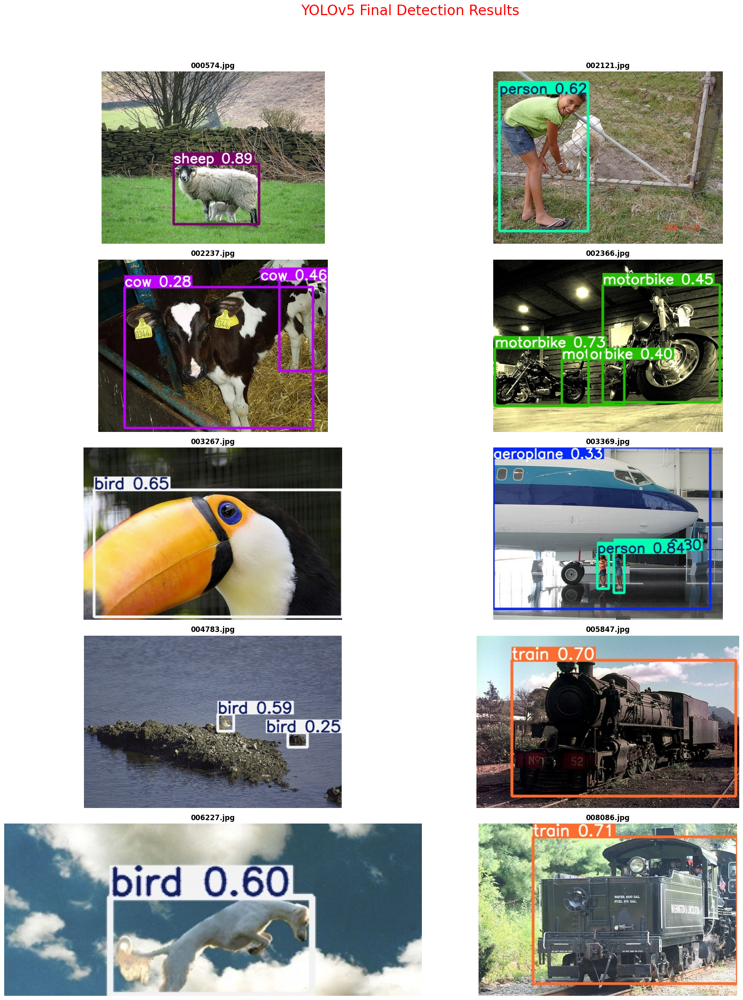

In [69]:
result_files = sorted(glob(os.path.join(result_dir, '*.jpg')))

if len(result_files) == 0:
    print("❌ 오류: 결과 파일이 생성되지 않았습니다.")
else:
    fig, axes = plt.subplots(5, 2, figsize=(20, 25))
    fig.suptitle('YOLOv5 Final Detection Results', fontsize=24, color='red')
    axes = axes.flatten()

    for i, img_path in enumerate(result_files):
        if i >= 10: break

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        file_name = os.path.basename(img_path)

        ax = axes[i]
        ax.imshow(img)
        ax.set_title(file_name, fontsize=12, fontweight='bold')
        ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()